In [34]:
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os


# HELPERS.py
# Todo Variance explainability (% of explainability > 80% ?)

from sklearn.preprocessing import MinMaxScaler  
import plotly.express as px  
from matplotlib.patches import Circle  
import matplotlib.pyplot as plt  
import seaborn as sns  
from mpl_toolkits.mplot3d import Axes3D  
import plotly.graph_objects as go

def normalize_dataframe(df):
    scaler = MinMaxScaler()
    return pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

config_kmeans_range = range(1,11)
def get_kmeans_cluster_inertia(df):
    r_inertia = []
    for k in config_kmeans_range:
        kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(df)
        r_inertia.append(kmeans.inertia_)
    return r_inertia

def show_kmeans_cluster_inertia(inertia, ax):
    plt.figure(figsize=(10,3))
    ax.grid()
    ax.plot(config_kmeans_range,inertia,marker='o')
    ax.set_xlabel('Number of Clusters')
    ax.set_ylabel('Inertia')

def show_pca_3d(df, nb_clusters, kmean_algorithm, kmean_init):  
    # Computing PCA  
    pca = PCA(n_components=3)  
    df_pca = pca.fit_transform(df)  
      
    # Running KMeans clustering  
    kmeans = KMeans(n_clusters=nb_clusters,random_state=0, algorithm=kmean_algorithm, n_init=kmean_init)  
    clusters = kmeans.fit_predict(df_pca)    
      
    # Extracting centroids and labels  
    centroids = kmeans.cluster_centers_    
    labels = kmeans.labels_  
      
    # Combining PCA results with cluster labels  
    df_combined = pd.DataFrame(df_pca, columns=['Component 1', 'Component 2', 'Component 3'])  
    df_combined['Cluster'] = labels  
      
    # Plotting 3D scatter plot  
    fig = px.scatter_3d(df_combined, x='Component 1', y='Component 2', z='Component 3', color='Cluster')  
      
    # Adding centroids as scatter plot markers  
    fig.add_trace(  
        go.Scatter3d(  
            x=centroids[:, 0],  
            y=centroids[:, 1],  
            z=centroids[:, 2],  
            marker=dict(  
                color='red',  
                size=5,  
                symbol='x'  
            ),  
            mode='markers',  
            name='Centroids'  
        )  
    )  
    fig.show()
import matplotlib.pyplot as plt  
import matplotlib.patches as patches

def show_pca_2d(df, nb_clusters, ax, kmean_algorithm, kmean_init):
    pca = PCA(n_components=2)
    df_pca = pca.fit_transform(df)
    
    kmeans = KMeans(n_clusters=nb_clusters,random_state=0, algorithm=kmean_algorithm, n_init=kmean_init)
    clusters = kmeans.fit_predict(df_pca)  

    # Assuming you have the KMeans centroids available  
    centroids = kmeans.cluster_centers_  
    labels = kmeans.labels_ 
    
    df_combined = pd.DataFrame(df_pca, columns=['Component 1', 'Component 2'])  
    df_combined['Cluster'] = labels  
    
    sns.scatterplot(data=df_combined, x='Component 1', y='Component 2', hue='Cluster', ax=ax)  
    ax.scatter(centroids[:, 0], centroids[:, 1], marker='x', color='red', s=200)    
    # Plotting circles around the centroids  
    for i, centroid in enumerate(centroids):  
        # circle = Circle((centroid[0], centroid[1]), 0.5, color='red', alpha=0.5, fill=False)  
        circle = patches.Circle((centroid[0], centroid[1]), 0.5, color='red', alpha=0.5, fill=False)  
        # circle = patches.Circle((0.5, 0.5), 0.4, edgecolor='r', facecolor='none')  
        ax.add_patch(circle)  
      
    ax.legend(loc='upper right')  
    # ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  
    # plt.show()  
    
def show_2d(df, nb_clusters, columns):
    kmeans = KMeans(n_clusters=nb_clusters,random_state=0, n_init=10)
    clusters = kmeans.fit_predict(df)  

    # Assuming you have the KMeans centroids available  
    centroids = kmeans.cluster_centers_  
    labels = kmeans.labels_ 
    
    df_combined = pd.DataFrame(df, columns=columns)  
    df_combined['Cluster'] = labels  
    
    sns.scatterplot(data=df_combined, x=columns[0], y=columns[1], hue='Cluster')  
    plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', color='red', s=200)
    
    # Plotting circles around the centroids  
    for i, centroid in enumerate(centroids):  
        circle = Circle((centroid[0], centroid[1]), 0.5, color='red', alpha=0.5, fill=False)  
        plt.gca().add_patch(circle)  
      
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  
    plt.show()  



def show_3d(df, x, y, z):  
    # Plotting 3D scatter plot  
    fig = px.scatter_3d(
        df,
        x=df[x], 
        y=df[y], 
        z=df[z],
        
        title="RFM (1000 clients)",
        opacity=0.5,
        width=1200,
        height=800,
    )  
    
        
    fig.show()
    
    
def show_segmentation(df, n_cluster, kmean_algorithm="lloyd",kmean_init=10):
    fig, axs = plt.subplots(1, 2, figsize=(15, 3))

    
    inertia = get_kmeans_cluster_inertia(df)

    show_kmeans_cluster_inertia(inertia, axs[0])
    show_pca_2d(df, n_cluster, axs[1], kmean_algorithm, kmean_init)
    plt.show()

    show_pca_3d(df, n_cluster, kmean_algorithm, kmean_init)

In [35]:
df = pd.read_csv("clean_df.csv")
df.head()

,customer_unique_id,recency,frequency,monetary,avg_satisfaction,recency_score,frequency_score,monetary_score
0,0000366f3b9a7992bf8c76cfdf3221e2,-116.0,1,129.90,5.0,4,1,4
1,0000b849f77a49e4a4ce2b2a4ca5be3f,-119.0,1,18.90,4.0,4,1,1
2,0000f46a3911fa3c0805444483337064,-542.0,1,69.00,3.0,1,1,2
3,0000f6ccb0745a6a4b88665a16c9f078,-326.0,1,25.99,4.0,2,1,1
4,0004aac84e0df4da2b147fca70cf8255,-293.0,1,180.00,5.0,2,1,5


In [36]:
df[df["customer_unique_id"] == "0000366f3b9a7992bf8c76cfdf3221e2"]

,customer_unique_id,recency,frequency,monetary,avg_satisfaction,recency_score,frequency_score,monetary_score
0,0000366f3b9a7992bf8c76cfdf3221e2,-116.0,1,129.9,5.0,4,1,4


In [32]:
show_3d(df.sample(n=1000, random_state=42), "recency", "frequency", "monetary")

In [38]:
df = normalize_dataframe(df.drop(['customer_unique_id'], axis=1))
df.head()

,recency,frequency,monetary,avg_satisfaction,recency_score,frequency_score,monetary_score
0,0.840659,0.0,0.009603,1.00,0.75,0.0,0.75
1,0.836538,0.0,0.001343,0.75,0.75,0.0,0.00
2,0.255495,0.0,0.005071,0.50,0.00,0.0,0.25
3,0.552198,0.0,0.001871,0.75,0.25,0.0,0.00
4,0.597527,0.0,0.013330,1.00,0.25,0.0,1.00


In [39]:
show_3d(df.sample(n=1000, random_state=42), "recency", "frequency", "monetary")

In [42]:
# from scipy.cluster.hierarchy import dendrogram, linkage

# dendrogram(
#         linkage(df.sample(frac=0.5, random_state=42), method="ward"),
#         truncate_mode="level",
#         p=2,
#     )

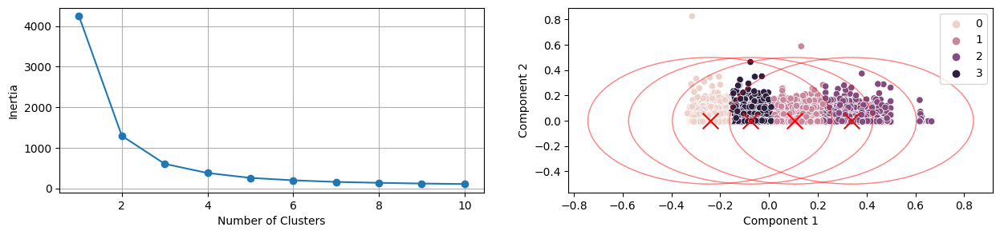

<Figure size 1000x300 with 0 Axes>

In [44]:
show_segmentation(df[["recency", "frequency", "monetary"]],4)